<a href="https://colab.research.google.com/github/SartJ/AI-Fun/blob/main/Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt # installing dependencies
%pip install -q roboflow 

import torch
import os
from IPython.display import Image, clear_output # to display image

print(f"Setup Complete. Using torch {torch.__version__}")
if torch.cuda.is_available():
  print(f"Using CUDA: {torch.cuda.get_device_properties(0).name}")
else:
  print("Using CPU.")

Cloning into 'yolov5'...
remote: Enumerating objects: 10222, done.
remote: Total 10222 (delta 0), reused 0 (delta 0), pack-reused 10222
Receiving objects: 100% (10222/10222), 10.53 MiB | 8.72 MiB/s, done.
Resolving deltas: 100% (7057/7057), done.
/content/yolov5/yolov5
Setup Complete. Using torch 1.10.0+cu111
Using CUDA: Tesla K80


In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [4]:
# setting up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Getting the Dataset from roboflow:

In [5]:
rf = Roboflow(api_key="fbGHBQu7e2SjY4jzLswo")
project = rf.workspace().project("occluded_cars")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/occluded_cars-1 in yolov5pytorch:: 100%|██████████| 527/527 [00:00<00:00, 967.25it/s] 


Training the YOLO Model

In [15]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/occluded_cars-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-147-g628817d torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0

Showing Results:

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1200), started 0:52:55 ago. (Use '!kill 1200' to kill it.)

<IPython.core.display.Javascript object>

Prediction:

In [17]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.3 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/datasets/occluded_cars-1/valid/images, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-147-g628817d torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/datasets/occluded_cars-1/valid/images/n02814533_105_JPEG.rf.881f4874909574ce3ec44bee5d6e128f.jpg: 416x416 2 cars, Done. (0.028s)
image 2/20 /content/datasets/occluded_cars-1/valid/images/n02814533_1178_JPEG.rf.c5389e851ca6a09ad14b3611c344adea.jpg: 416x416 2 cars, Done. (0.028s)
image 3/20 /content/datasets/occluded_cars-1/valid/images/n02814533_135

Displaying Inference Images:

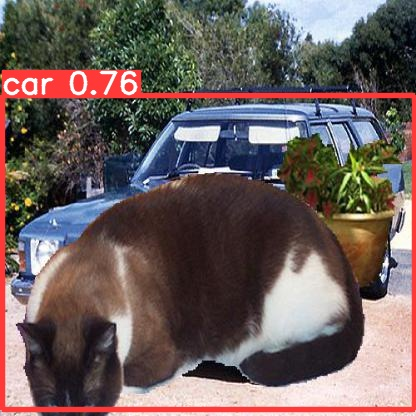

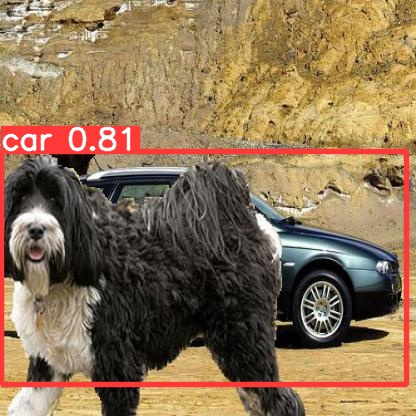

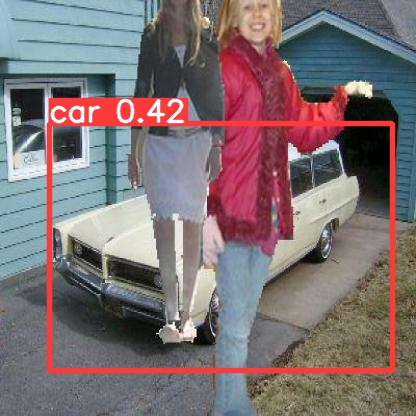

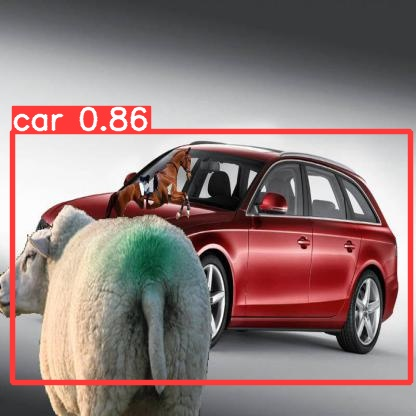

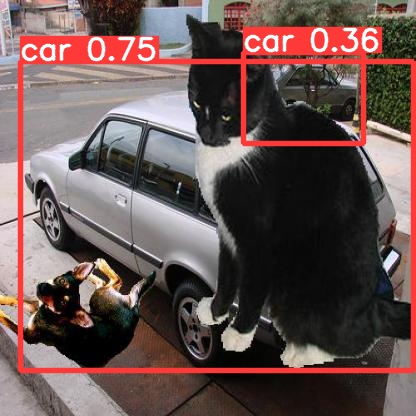

...

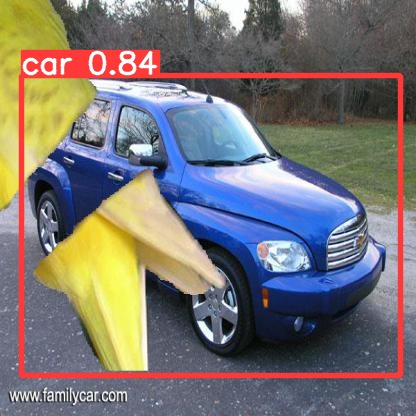

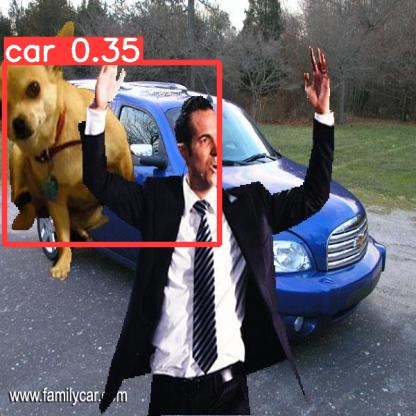

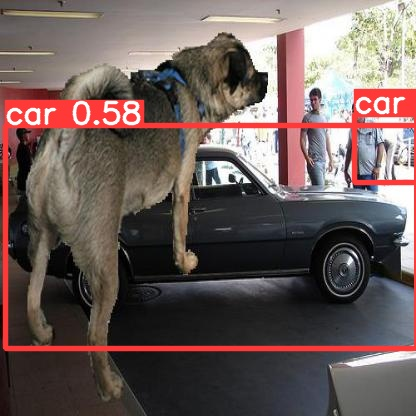

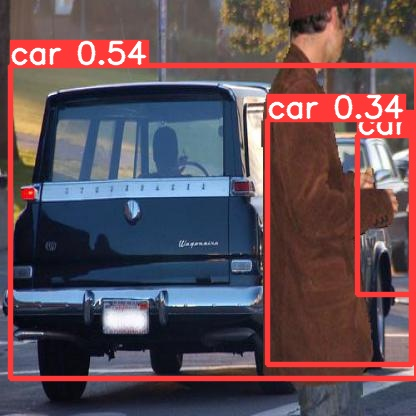

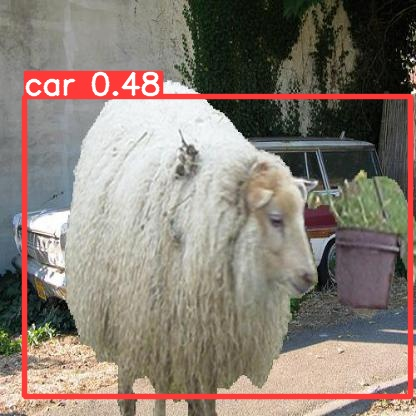

In [19]:
# display inference on ALL test images:

import glob
from IPython.display import Image, display

i = 0
# choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
  i += 1
  
  if i < 20:
    display(Image(filename=imageName))
    print("\n")

Saving the Model:

In [20]:
# export the model's weights for future use:

from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Inference after first try with 100 epochs and 0.1 confidence rate

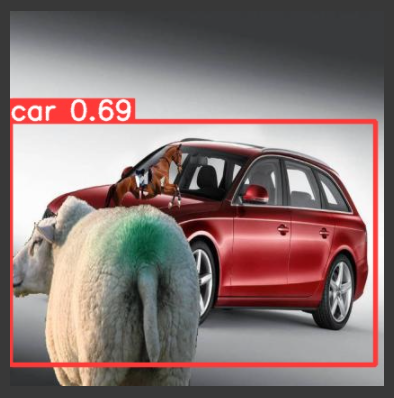